<a href="https://colab.research.google.com/github/akaicomet/NJOITOpenDataCenter-Pension-Record/blob/master/NJOITOpenDataCenter_Pension_Record_DataPreparation_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip install pandas
!pip install tqdm
!pip install scikit-learn
!pip install sodapy
!pip install matplotlib
!pip install hyperopt
!pip install bayesian-optimization
!pip install tbvaccine 
!pip install MulticoreTSNE

    100% |████████████████████████████████| 61kB 5.4MB/s 
    100% |████████████████████████████████| 829kB 19.6MB/s 
  Running setup.py bdist_wheel for future ... - \ | / done
  Stored in directory: /root/.cache/pip/wheels/0c/61/d2/d6b7317325828fbb39ee6ad559dbe4664d0896da4721bf379e
Successfully built future
spacy 2.0.18 has requirement numpy>=1.15.0, but you'll have numpy 1.14.6 which is incompatible.
google-colab 0.0.1a1 has requirement requests~=2.18.0, but you'll have requests 2.21.0 which is incompatible.
featuretools 0.4.1 has requirement pandas>=0.23.0, but you'll have pandas 0.22.0 which is incompatible.
cufflinks 0.14.6 has requirement plotly>=3.0.0, but you'll have plotly 1.12.12 which is incompatible.
  Found existing installation: requests 2.18.4
    Uninstalling requests-2.18.4:
      Successfully uninstalled requests-2.18.4
  Found existing installation: future 0.16.0
    Uninstalling future-0.16.0:
      Successfully uninstalled future-0.16.0
  Running setup.py b

#1. Copy python files from  GItHub repository to local

In [0]:
!git clone https://github.com/akaicomet/NJOITOpenDataCenter.git
!git clone https://github.com/akaicomet/akaicomet_Utility.git
!git clone https://github.com/akaicomet/akaicomet_Chart.git
!git clone https://github.com/akaicomet/akaicomet_ML.git

Cloning into 'NJOITOpenDataCenter'...
remote: Enumerating objects: 60, done.
remote: Counting objects: 100% (60/60), done.
remote: Compressing objects: 100% (60/60), done.
remote: Total 60 (delta 32), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (60/60), done.
Cloning into 'akaicomet_Utility'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 12 (delta 3), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (12/12), done.
Cloning into 'akaicomet_Chart'...
remote: Enumerating objects: 49, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 49 (delta 13), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (49/49), done.
Cloning into 'akaicomet_ML'...
remote: Enumerating objects: 130, done.
remote: Counting objects: 100% (130/130), done.
remote: Compressing objects: 100% (130/130), done.
remote: Total 130

#2. Run .py files in local

In [0]:
%run -i /content/akaicomet_Utility/ErrorHandling.py

%run -i /content/NJOITOpenDataCenter/YourMoneyActivePensionMembers.py 
%run -i /content/NJOITOpenDataCenter/YourMoneyRetiredPensionMembers.py
%run -i /content/NJOITOpenDataCenter/YourMoneyPensionMembersMerge.py

%run -i /content/akaicomet_Chart/X-Ray_Scan.py
%run -i /content/akaicomet_Chart/akaicomet_Chart.py

%run -i /content/akaicomet_ML/ML_Init.py
%run -i /content/akaicomet_ML/ML_Auto.py
%run -i /content/akaicomet_ML/AutoFeatureEngineering.py


#3. Import libraries

In [0]:
import pandas as pd
import numpy as np
#import matplotlib.pyplot as plt
import random
from sodapy import Socrata
#from pandas.plotting import scatter_matrix
#from datetime import datetime
import seaborn as sb
from tqdm import tqdm
import warnings
from textwrap import wrap

#4. YourMoney and the NJOIT Open Data Center 
##4.1 YourMoney Active Pension Members API

**Pension member data load from NJOIT** 

In [0]:
client = Socrata("data.nj.gov", None)
results = client.get("45bd-gwii", limit=100000000)#100000000

**Data Cleansing and Preparation for YourMoney Active Pension Members data**

In [0]:
ActivePension_df = ActivePensionDataWrangler(results)

##4.2 YourMoney Retired Pension Members API
**Pension payment member data load from NJOIT**

In [0]:
results = client.get("8up4-62p6",   limit=100000000)

**Data Cleansing and Preparation for YourMoney Retired Pension data**

In [0]:
RetiredPension_df_grped = RetiredPensionMembersDataWrangler(results)

**Merge YourMoney Active Pension Members data and YourMoney Retired Pension data**

In [0]:
ActivePension_df = PensionMembersMerge(ActivePension_df,RetiredPension_df_grped)

#5. Feature Engineering:
##5.1 Variable Importance Chart and Selection

## RFECV variable selection and Scaliing Data:

**About feature_importance_RFECV function:**
This function is based on sklearn.feature_selection.RFECV (**F**eature ranking with **R**ecursive feature **E**limination and **C**ross-**V**alidated selection of the best number of features). Pass data (i.e X_Train) and the function applies scaling transformation, apply RFECV method to see if variable shoud be included and return grid score chart and support count for each transformation. x_cols stores supported variables selected when support count  is equal to _v (here 100) or greater.     

**ML Algorithms used for RFECV variable selection:**

feature_importance_models = [

    ['AdaBoost',AdaBoostClassifier(random_state=0)],
    ['ExtraTrees',ExtraTreesClassifier(random_state=0)],
    ['GradientBoosting',GradientBoostingClassifier(random_state=0)],
    ['RandomForest',RandomForestClassifier(random_state=0)],
    ['DecisionTree',DecisionTreeClassifier(random_state=0)],
    ['LogisticRegression',LogisticRegression(random_state=0)]
    
]

**Scaling Algorithms:**

scalers = {

  'KernelCenterer': KernelCenterer(),  
  
  'MinMaxScaler': MinMaxScaler(),
  
  'Normalizer': Normalizer(),
  
  'RobustScaler': RobustScaler(),
  
  'StandardScaler': StandardScaler(),
  
  'PowerTransformer':PowerTransformer(),
  
  'QuantileTransformer':QuantileTransformer()
  
}


 


Scale conversion by AdaBoost
 


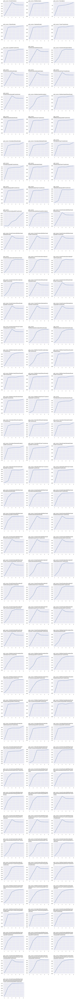

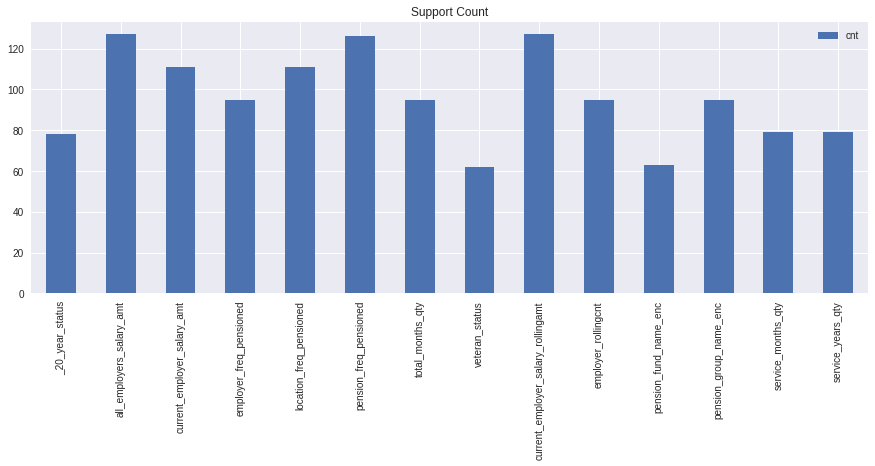

                       KernelCenterer|  grid scores  \
0             all_employers_salary_amt     0.521713   
1          current_employer_salary_amt     0.576282   
2              location_freq_pensioned     0.629138   
3               pension_freq_pensioned     0.611511   
4   current_employer_salary_rollingamt     0.609792   
5                                  NaN     0.609362   
6                                  NaN          NaN   
7                                  NaN          NaN   
8                                  NaN          NaN   
9                                  NaN          NaN   
10                                 NaN          NaN   
11                                 NaN          NaN   
12                                 NaN          NaN   
13                                 NaN          NaN   

                         MinMaxScaler|  grid scores  \
0                      _20_year_status     0.802775   
1             all_employers_salary_amt     0.871074   
2        

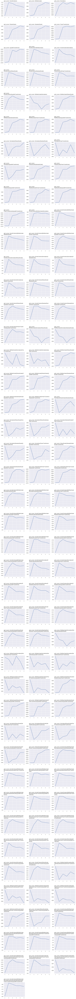

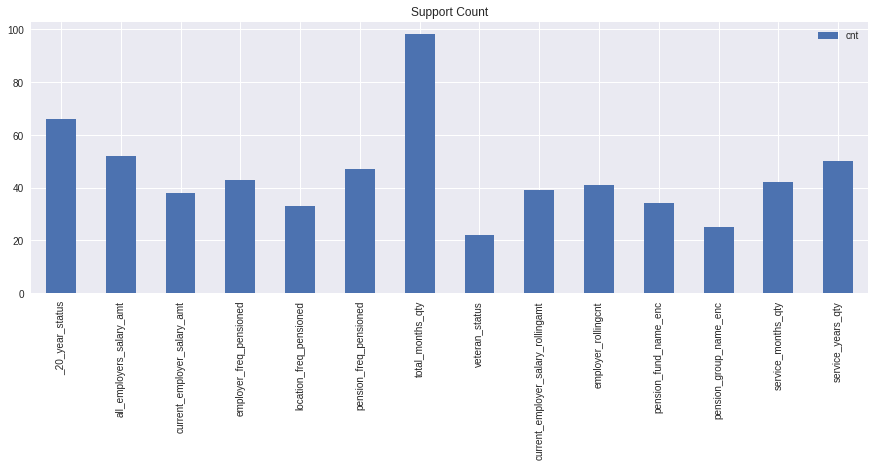

           KernelCenterer|  grid scores                       MinMaxScaler|  \
0   pension_freq_pensioned     0.550073                     _20_year_status   
1         total_months_qty     0.722815            all_employers_salary_amt   
2                      NaN     0.710794         current_employer_salary_amt   
3                      NaN     0.684575             employer_freq_pensioned   
4                      NaN     0.674263             location_freq_pensioned   
5                      NaN     0.661372                    total_months_qty   
6                      NaN          NaN  current_employer_salary_rollingamt   
7                      NaN          NaN                 employer_rollingcnt   
8                      NaN          NaN               pension_fund_name_enc   
9                      NaN          NaN                  service_months_qty   
10                     NaN          NaN                   service_years_qty   
11                     NaN          NaN             

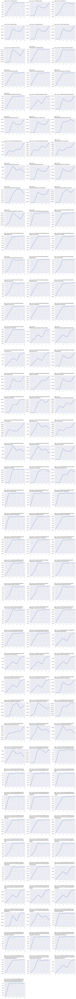

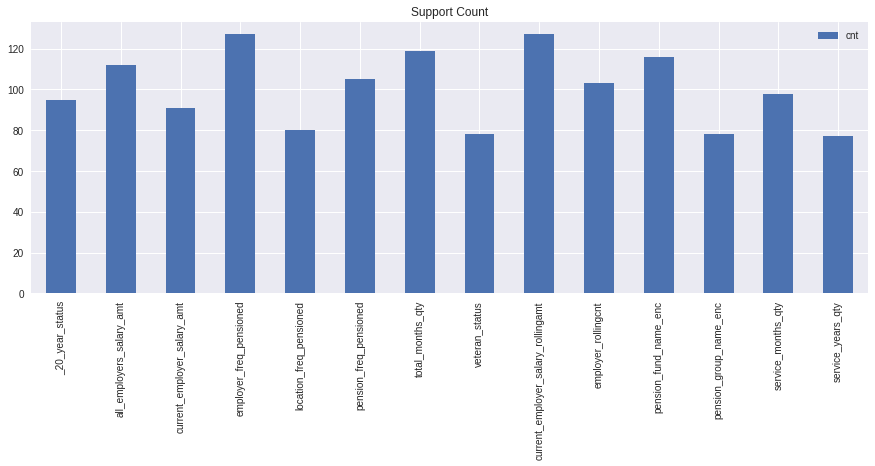

                       KernelCenterer|  grid scores  \
0                      _20_year_status     0.482172   
1             all_employers_salary_amt     0.554792   
2          current_employer_salary_amt     0.621402   
3              employer_freq_pensioned     0.625268   
4              location_freq_pensioned     0.626126   
5               pension_freq_pensioned     0.627845   
6                     total_months_qty          NaN   
7                       veteran_status          NaN   
8   current_employer_salary_rollingamt          NaN   
9                  employer_rollingcnt          NaN   
10               pension_fund_name_enc          NaN   
11              pension_group_name_enc          NaN   
12                  service_months_qty          NaN   
13                   service_years_qty          NaN   

                         MinMaxScaler|  grid scores  \
0                      _20_year_status      0.87537   
1             all_employers_salary_amt      0.87537   
2        

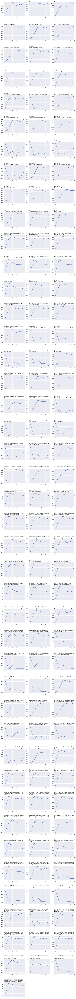

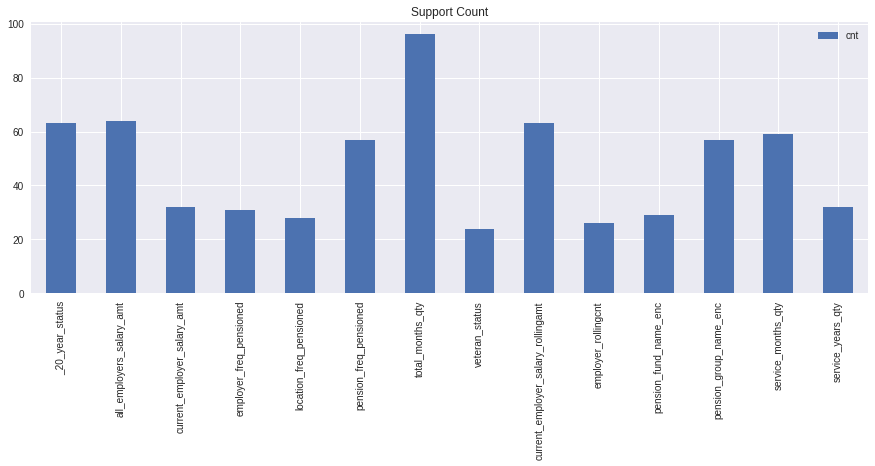

                       KernelCenterer|  grid scores  \
0             all_employers_salary_amt     0.541034   
1               pension_freq_pensioned     0.655384   
2                     total_months_qty     0.690596   
3   current_employer_salary_rollingamt     0.655786   
4               pension_group_name_enc     0.671257   
5                                  NaN     0.663951   
6                                  NaN          NaN   
7                                  NaN          NaN   
8                                  NaN          NaN   
9                                  NaN          NaN   
10                                 NaN          NaN   
11                                 NaN          NaN   
12                                 NaN          NaN   
13                                 NaN          NaN   

                         MinMaxScaler|  grid scores  \
0                      _20_year_status     0.874082   
1             all_employers_salary_amt     0.878807   
2        

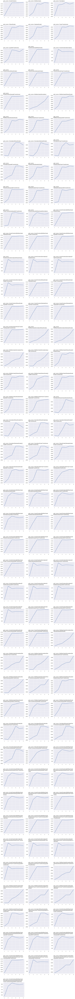

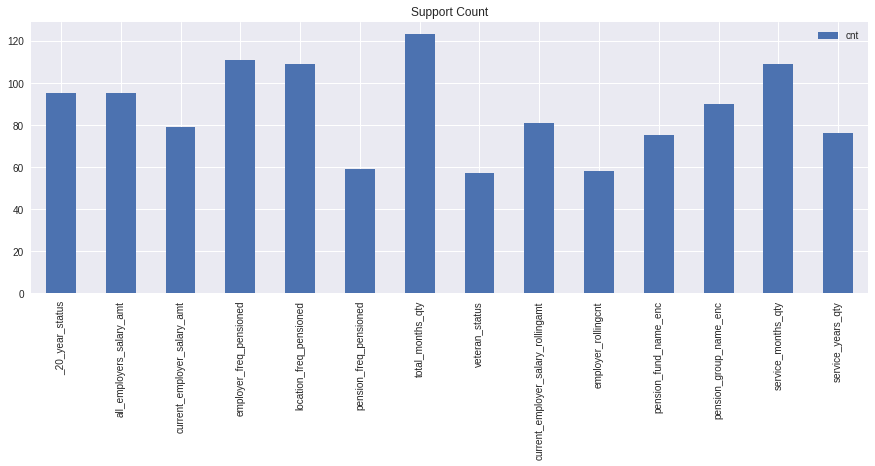

                       KernelCenterer|  grid scores  \
0                      _20_year_status     0.559101   
1             all_employers_salary_amt     0.641188   
2          current_employer_salary_amt     0.712511   
3              employer_freq_pensioned     0.712080   
4              location_freq_pensioned     0.713372   
5               pension_freq_pensioned     0.715949   
6                     total_months_qty          NaN   
7                       veteran_status          NaN   
8   current_employer_salary_rollingamt          NaN   
9                  employer_rollingcnt          NaN   
10               pension_fund_name_enc          NaN   
11              pension_group_name_enc          NaN   
12                  service_months_qty          NaN   
13                   service_years_qty          NaN   

                         MinMaxScaler|  grid scores               Normalizer|  \
0                      _20_year_status     0.875370           _20_year_status   
1           

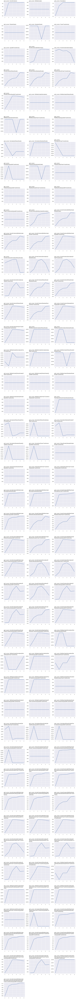

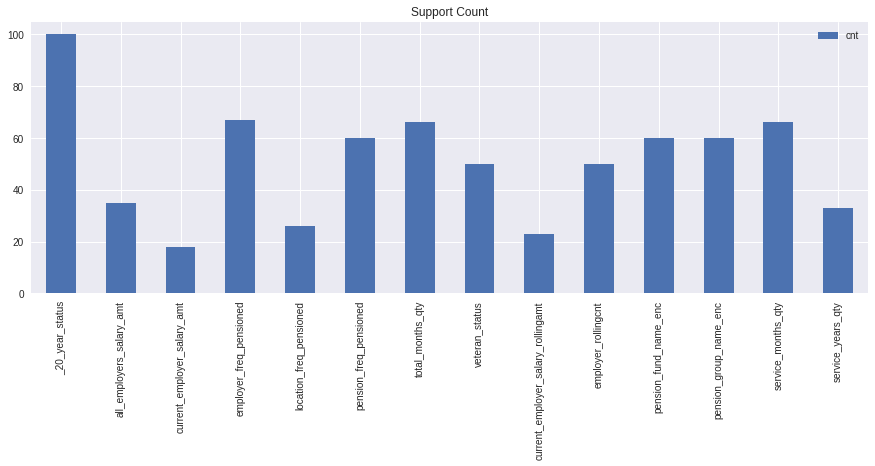

                       KernelCenterer|  grid scores    MinMaxScaler|  \
0                      _20_year_status     0.000000  _20_year_status   
1             all_employers_salary_amt     0.843574              NaN   
2          current_employer_salary_amt     0.845293              NaN   
3              employer_freq_pensioned     0.844864              NaN   
4              location_freq_pensioned     0.851311              NaN   
5               pension_freq_pensioned     0.858614              NaN   
6                     total_months_qty          NaN              NaN   
7                       veteran_status          NaN              NaN   
8   current_employer_salary_rollingamt          NaN              NaN   
9                  employer_rollingcnt          NaN              NaN   
10               pension_fund_name_enc          NaN              NaN   
11              pension_group_name_enc          NaN              NaN   
12                  service_months_qty          NaN             

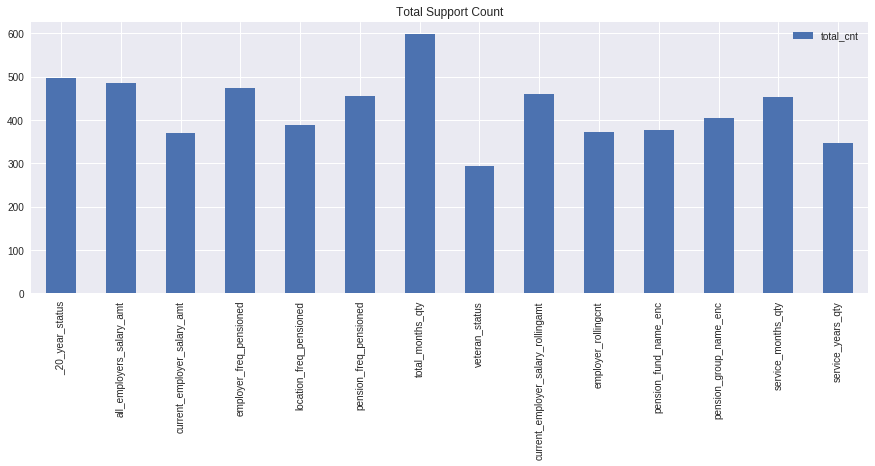

In [0]:
y_train = ActivePension_df.sample(n=5000, random_state=0)['IsPensionPaid'].as_matrix()
X_train = ActivePension_df.sample(n=5000, random_state=0)[['_20_year_status','all_employers_salary_amt','current_employer_salary_amt','employer_freq_pensioned','location_freq_pensioned','pension_freq_pensioned','total_months_qty','veteran_status','current_employer_salary_rollingamt','employer_rollingcnt','pension_fund_name_enc','pension_group_name_enc','service_months_qty','service_years_qty']]

#Suppress RandomForestClassifier warning
warnings.filterwarnings('ignore')
x_cols = feature_importance_RFECV2(X_train, y_train, 'recall', 100)
warnings.filterwarnings('default')  

## Result & Explanation:
Random sampling data (n = 5000) was used to run feature selection model due to performance acceleration. The very last chart shows final support counts. None of variables are sufficiently selected as unimportant variables. Each scaling and redemensioning transformation picks different "variables to be included" but over all it picks most of variables evenly and concludes that none of variables are extremely unimportant to be excluded. "veteran_status" is relatively low supported variable you may want to exclude.


##5.2 Correlation Variable Validation: 
This valifdation checks highly correlated variables and keeps only one of them.  

In [0]:
ActivePension_df[x_cols].corr()

,_20_year_status,all_employers_salary_amt,current_employer_salary_amt,employer_freq_pensioned,location_freq_pensioned,pension_freq_pensioned,total_months_qty,current_employer_salary_rollingamt,employer_rollingcnt,pension_fund_name_enc,pension_group_name_enc,service_months_qty,service_years_qty
_20_year_status,1.000000,0.297813,0.284825,-0.075939,0.084086,0.091553,0.847924,0.081501,-0.000759,-0.235994,-0.115523,-0.003039,0.847748
all_employers_salary_amt,0.297813,1.000000,0.936075,-0.068113,-0.029716,-0.437993,0.398091,0.363874,0.047345,0.209750,0.097720,-0.024790,0.398617
current_employer_salary_amt,0.284825,0.936075,1.000000,-0.050316,-0.019265,-0.470794,0.385418,0.357086,0.000135,0.220145,0.104031,-0.029305,0.386066
employer_freq_pensioned,-0.075939,-0.068113,-0.050316,1.000000,0.190320,0.039999,-0.067652,-0.092105,-0.086235,0.098182,-0.034920,0.024721,-0.068276
location_freq_pensioned,0.084086,-0.029716,-0.019265,0.190320,1.000000,0.307784,0.066795,-0.015280,-0.015096,0.044708,-0.063973,0.054510,0.065354
pension_freq_pensioned,0.091553,-0.437993,-0.470794,0.039999,0.307784,1.000000,0.047566,-0.188436,-0.022374,-0.314764,-0.314524,0.076678,0.045553
total_months_qty,0.847924,0.398091,0.385418,-0.067652,0.066795,0.047566,1.000000,0.088613,-0.022816,-0.185774,-0.121786,0.001487,0.999660
current_employer_salary_rollingamt,0.081501,0.363874,0.357086,-0.092105,-0.015280,-0.188436,0.088613,1.000000,0.866598,0.127297,0.062030,-0.011052,0.088875
employer_rollingcnt,-0.000759,0.047345,0.000135,-0.086235,-0.015096,-0.022374,-0.022816,0.866598,1.000000,0.045044,0.020261,-0.000356,-0.022800
pension_fund_name_enc,-0.235994,0.209750,0.220145,0.098182,0.044708,-0.314764,-0.185774,0.127297,0.045044,1.000000,0.188578,0.055554,-0.187166


## Result & Explanation:
Highly correlated variable set is the followed.



service_years_qty v.s _20_year_status

service_years_qty v.s total_months_qty

employer_rollingcnt v.s current_employer_salary_rollingamt

total_months_qty v.s _20_year_status

Drop service_years_qty since total_months_qty counts same nature. 

Drop employer_rollingcn since saralyamoun is supposed to be important for retired life rather than how many employers tehy worked for. 

current_employer_salary_amt is also dropped due to less important as shown in Total Support Count chart above 

## 5.3 Recheck  Correlation Variable Validation:

In [0]:
x_cols2 = ['_20_year_status',	'all_employers_salary_amt',		'employer_freq_pensioned', 'total_months_qty',	'location_freq_pensioned',		'current_employer_salary_rollingamt', 	'service_months_qty',	'pension_freq_pensioned', 'pension_fund_name_enc', 'pension_group_name_enc' ]
ActivePension_df[x_cols2].corr()

,_20_year_status,all_employers_salary_amt,employer_freq_pensioned,total_months_qty,location_freq_pensioned,current_employer_salary_rollingamt,service_months_qty,pension_freq_pensioned,pension_fund_name_enc,pension_group_name_enc
_20_year_status,1.000000,0.297813,-0.075939,0.847924,0.084086,0.081501,-0.003039,0.091553,-0.235994,-0.115523
all_employers_salary_amt,0.297813,1.000000,-0.068113,0.398091,-0.029716,0.363874,-0.024790,-0.437993,0.209750,0.097720
employer_freq_pensioned,-0.075939,-0.068113,1.000000,-0.067652,0.190320,-0.092105,0.024721,0.039999,0.098182,-0.034920
total_months_qty,0.847924,0.398091,-0.067652,1.000000,0.066795,0.088613,0.001487,0.047566,-0.185774,-0.121786
location_freq_pensioned,0.084086,-0.029716,0.190320,0.066795,1.000000,-0.015280,0.054510,0.307784,0.044708,-0.063973
current_employer_salary_rollingamt,0.081501,0.363874,-0.092105,0.088613,-0.015280,1.000000,-0.011052,-0.188436,0.127297,0.062030
service_months_qty,-0.003039,-0.024790,0.024721,0.001487,0.054510,-0.011052,1.000000,0.076678,0.055554,-0.032797
pension_freq_pensioned,0.091553,-0.437993,0.039999,0.047566,0.307784,-0.188436,0.076678,1.000000,-0.314764,-0.314524
pension_fund_name_enc,-0.235994,0.209750,0.098182,-0.185774,0.044708,0.127297,0.055554,-0.314764,1.000000,0.188578
pension_group_name_enc,-0.115523,0.097720,-0.034920,-0.121786,-0.063973,0.062030,-0.032797,-0.314524,0.188578,1.000000
